# 01 Milestone Project 1: 🍔👁 Food Vision Big™
In this notebook, We're going to be building Food Vision Big, using all of the data from the Food101 dataset.

All 75,750 training images and 25,250 testing images
## What we're going to cover

* Using TensorFlow Datasets to download and explore data
* Creating preprocessing function for our data
* Batching & preparing datasets for modelling (**making our datasets run fast**)
* Creating modelling callbacks
* Setting up **mixed precision training**
* Building a feature extraction model
* Fine-tuning the feature extraction model
* Viewing training results on TensorBoard


# Downloading Food101 dataset from Tensorflow Datasets

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tdfs

To get the list of available datasets, use tfds.list_builders()

In [ ]:
# Check whether our Food101 dataset is present in TDFS or not
Datasets_list = tdfs.list_builders()

target = "food101"
print(f"The {target} dataset is present in {target in Datasets_list}")


The food101 dataset is present in True


The easiest way of loading a dataset is `tfds.load`. It will:

* Download the data and save it as tfrecord files.
* Load the tfrecord and create the tf.data.Dataset.
* split= it splits the data ["train","validation"]
* shuffle_files=: Control whether to shuffle the files between each epoch (TFDS store big datasets in multiple smaller files).
* with_info=True: Returns the tfds.core.DatasetInfo containing dataset metadata

In [ ]:
(train_data, test_data), ds_info = tdfs.load("food101",
                                             split=["train", "validation"],
                                             shuffle_files=True,
                                             as_supervised=True,
                                             with_info=True)


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.FRZ7H6_2.0.0/food101-train.tfrecord*...:   0%|         …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.FRZ7H6_2.0.0/food101-validation.tfrecord*...:   0%|    …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


By using `with_info = True` returns the dataset info  

In [ ]:
# check what features does our dataset have
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})

In [ ]:
class_names = ds_info.features['label'].names
class_names[:20]
# class_names[82]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheesecake',
 'cheese_plate',
 'chicken_curry',
 'chicken_quesadilla']

# Create a preprocessing function for our data


In [ ]:
# first take one sample of our data and know its (shape,dtype)
sample_of_train_data = train_data.take(1)
sample_of_train_data

<_TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [ ]:
for image, label in sample_of_train_data:
  print(f'''
  The image has shape: {image.shape},
  The image data type:{image.dtype},
  The label of an image in (tensor form):{label},
  The label of an image in (str form): {class_names[label.numpy()]}
  ''')


  The image has shape: (512, 512, 3),
  The image data type:<dtype: 'uint8'>,
  The label of an image in (tensor form):43,
  The label of an image in (str form): fried_calamari
  


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

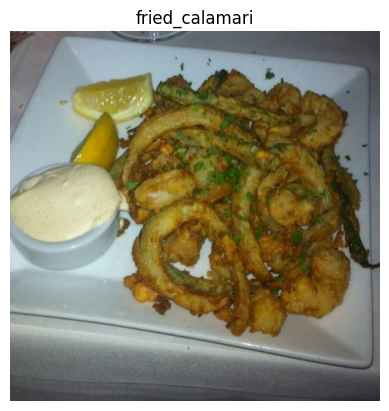

In [ ]:
# let's visualize the image
import matplotlib.pyplot as plt
plt.imshow(image)
plt.title(class_names[label.numpy()])
plt.axis(False)

I created a function that helps us to make all images convert `shape into (224,224)` and `data type from unit8 to float32`

In [ ]:
def preprocess_img(image, label, img_shape=224):
  image = tf.image.resize(image,[img_shape,img_shape])
  return tf.cast(image, dtype=tf.float32),label

In [ ]:
preprocessed_img = preprocess_img(image,label)[0]
preprocessed_img

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[ 65.81122 ,  54.811222,  50.811222],
        [ 73.331635,  62.331635,  58.331635],
        [104.015305,  89.80102 ,  86.80102 ],
        ...,
        [ 61.85712 ,  59.071384,  65.64286 ],
        [ 65.      ,  60.      ,  67.      ],
        [ 64.64282 ,  59.642822,  66.64282 ]],

       [[ 67.28571 ,  56.285717,  52.285717],
        [ 66.47449 ,  55.47449 ,  51.47449 ],
        [ 67.73979 ,  53.525505,  50.525505],
        ...,
        [ 64.14284 ,  61.3571  ,  67.92857 ],
        [ 65.93368 ,  60.933674,  67.93368 ],
        [ 64.285645,  59.285645,  66.285645]],

       [[ 58.214287,  47.214287,  43.214287],
        [ 60.867348,  46.867348,  43.867348],
        [ 71.03062 ,  55.89286 ,  52.938778],
        ...,
        [ 62.999977,  60.382614,  66.61734 ],
        [ 65.05613 ,  60.056133,  66.84185 ],
        [ 64.36218 ,  59.362183,  66.147896]],

       ...,

       [[ 64.43876 ,  65.43876 ,  67.43876 ],
        [ 66.

(224, 224, 3),<dtype: 'float32'>


(np.float64(-0.5), np.float64(223.5), np.float64(223.5), np.float64(-0.5))

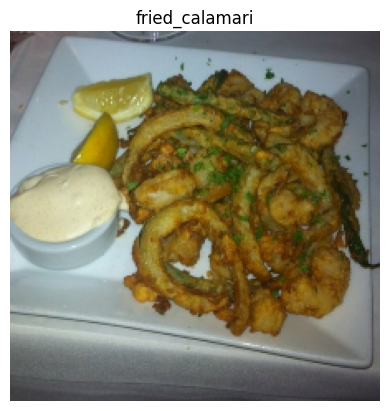

In [ ]:
print(f"{preprocessed_img.shape},{preprocessed_img.dtype}")
plt.imshow(preprocessed_img/255.)
plt.title(class_names[label.numpy()])
plt.axis(False)


# Batching & preparing datasets for modelling (making our datasets run fast)

In this section we are going to make our images to form a batch of size 32 so that it can instead of going to run all at once it will run one batche of images at a time.

In [ ]:
train_data, test_data

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>)

By using `map()` we are going to map all images to the associated function, `num_parallel_calls=tf.data.AUTOTNE` it allocate all the available CPU to this

In [ ]:
# Map preprocessing function to training data (and paralellize)
train_data = train_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)
# Shuffle train_data and turn it into batches and prefetch it (load it faster)
train_data = train_data.shuffle(buffer_size=1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

# Map prepreprocessing function to test data
test_data = test_data.map(preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)
# Turn test data into batches (don't need to shuffle)
test_data = test_data.batch(32).prefetch(tf.data.AUTOTUNE)

In [ ]:
train_data, test_data

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>)

# Create modelling callbacks

In [ ]:
# import helper functions
import os
import pathlib
if not os.path.exists("helper_functions.py"):
  !wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/bd065b806249f7b1155e5b1fabd130c5cfc9d184/extras/helper_functions.py
else:
  print("The helper_functions.py already exists skipping download...")

--2025-10-31 16:50:39--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/bd065b806249f7b1155e5b1fabd130c5cfc9d184/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0.001s  

2025-10-31 16:50:39 (16.9 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [ ]:
from helper_functions import create_tensorboard_callback

In [ ]:
checkpoint_path = "model_checkpoint/cp.cpkt.weights.h5"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                      monitor="val_accuracy",
                                                      save_best_only=True,
                                                      save_weights_only=True,
                                                      verbose=0)


# Setting up mixed precision training

In [ ]:
# Turn on mixed precision training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy(policy="mixed_float16") # set global policy to mixed precision

In [ ]:
mixed_precision.global_policy() # should output "mixed_float16" (if your GPU is compatible with mixed precision)

<DTypePolicy "mixed_float16">

#Build feature extraction model using EfficientNetV2B0

Callbacks: ready to roll.

Mixed precision: turned on.

Let's build a model.

Because our dataset is quite large, we're going to move towards fine-tuning an existing pretrained model (EfficienetNetV20).

But before we get into fine-tuning, let's set up a feature-extraction model.

Recall, the typical order for using transfer learning is:

1. Build a feature extraction model (replace the top few layers of a pretrained model)
2. Train for a few epochs with lower layers frozen
3. Fine-tune if necessary with multiple layers unfrozen

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers


In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),                     # horizontal flip
    tf.keras.layers.RandomRotation(0.20),                         # rotate up to ±20%
    tf.keras.layers.RandomTranslation(0.12, 0.12),                # translate
    tf.keras.layers.RandomZoom(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2)),  # zoom in/out
    tf.keras.layers.RandomContrast(0.20),                         # contrast jitter
    tf.keras.layers.RandomWidth(0.2),
    tf.keras.layers.RandomHeight(0.2)
], name="heavy_augment")


In [ ]:
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False
inputs = tf.keras.layers.Input(shape=(224,224,3), name="Input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
# print(f"Output shape of base_model: {x.shape}, dtype: {x.dtype}")
x = tf.keras.layers.GlobalAveragePooling2D(name="Pooling_layer")(x)
x = tf.keras.layers.Dense(len(class_names))(x)
x = tf.keras.layers.Dropout(0.3)(x)
outputs = tf.keras.layers.Activation("softmax", dtype=tf.float32, name="softmax_float32")(x)
model_1 = tf.keras.Model(inputs, outputs)
model_1.compile(loss="sparse_categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
                metrics=["accuracy"])

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
model_1.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ heavy_augment (Sequential)      │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, None, None,     │     5,919,312 │
│                                 │ 1280)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pooling_layer                   │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 101)            │       129,381 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 101)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax_float32 (Activation)    │ (None, 101)            │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,048,693 (23.07 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [ ]:
# check which layers have what dtypes
for layer in model_1.layers:
  print(layer.name, layer.trainable, layer.dtype,layer.dtype_policy)

Input_layer True float32 <DTypePolicy "mixed_float16">
heavy_augment True float32 <DTypePolicy "mixed_float16">
efficientnetv2-b0 False float32 <DTypePolicy "mixed_float16">
Pooling_layer True float32 <DTypePolicy "mixed_float16">
dense True float32 <DTypePolicy "mixed_float16">
dropout True float32 <DTypePolicy "mixed_float16">
softmax_float32 True float32 <DTypePolicy "float32">


In [ ]:
len(train_data), 32 * 2368,len(test_data),790*32

(2368, 75776, 790, 25280)

In [ ]:
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',      # or 'val_accuracy'
    patience=3,              # stop after 5 epochs with no improvement
    verbose=1,
    restore_best_weights=True
)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,        # multiply LR by this factor
    patience=3,        # wait epochs before reducing
    min_lr=1e-7,
    verbose=1
)

In [ ]:
# tf.get_logger().setLevel("Error")
history_1 = model_1.fit(train_data,
                        epochs=15,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=int(0.15*len(test_data)),
                        callbacks=[create_tensorboard_callback("training_logs", "efficientnetb0_101_classes_all_data_feature_extract"), model_checkpoint, early_stop, reduce_lr]
                        )

Saving TensorBoard log files to: training_logs/efficientnetb0_101_classes_all_data_feature_extract/20251031-165148
Epoch 1/15
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 920s 377ms/step - accuracy: 0.2481 - loss: 3.4921 - val_accuracy: 0.6086 - val_loss: 1.7005 - learning_rate: 0.0010
Epoch 2/15
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 376s 158ms/step - accuracy: 0.3737 - loss: 2.8389 - val_accuracy: 0.6409 - val_loss: 1.5119 - learning_rate: 0.0010
Epoch 3/15
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 309s 127ms/step - accuracy: 0.3944 - loss: 2.7403 - val_accuracy: 0.6578 - val_loss: 1.4376 - learning_rate: 0.0010
Epoch 4/15
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 266s 111ms/step - accuracy: 0.4029 - loss: 2.6970 - val_accuracy: 0.6618 - val_loss: 1.3943 - learning_rate: 0.0010
Epoch 5/15
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 304s 104ms/step - accuracy: 0.4127 - loss: 2.6445 - val_accuracy: 0.6732 - val_loss: 1.3473 - learning_rate: 0.0010
Epoch 6/15
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 237s 99ms/step - accuracy: 0.4141 - loss: 2.6406 - va

In [ ]:
model_1.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.6847 - loss: 1.2484


[1.2452821731567383, 0.6872475147247314]

In [ ]:
  # base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = True
for layers in base_model.layers[-100:]:
    layers.trainable = False

In [ ]:
# Recompile model with lower learning rate

model_1.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), # 10x lower learning rate than default
              metrics=['accuracy'])

In [ ]:
# Fine-tune for 3 more epochs
fine_tune_epochs = 30 # model has already done 3 epochs, this is the total number of epochs we're after (3+3=06)

history_2 = model_1.fit(train_data,
                        epochs=fine_tune_epochs,
                        validation_data=test_data,
                        validation_steps=int(0.15 * len(test_data)), # validate on 15% of the test data
                        initial_epoch=history_1.epoch[-1],
                        callbacks=[early_stop, reduce_lr]
                        ) # start from previous last epoch

Epoch 10/20
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 339s 131ms/step - accuracy: 0.5115 - loss: 1.9853 - val_accuracy: 0.6711 - val_loss: 1.2300
Epoch 11/20
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 259s 108ms/step - accuracy: 0.5747 - loss: 1.6789 - val_accuracy: 0.6830 - val_loss: 1.1706
Epoch 12/20
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 249s 104ms/step - accuracy: 0.6015 - loss: 1.5677 - val_accuracy: 0.6931 - val_loss: 1.1211
Epoch 13/20
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 255s 106ms/step - accuracy: 0.6119 - loss: 1.5124 - val_accuracy: 0.6994 - val_loss: 1.0929
Epoch 14/20
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 261s 109ms/step - accuracy: 0.6193 - loss: 1.4819 - val_accuracy: 0.7090 - val_loss: 1.0500
Epoch 15/20
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 258s 108ms/step - accuracy: 0.6198 - loss: 1.4502 - val_accuracy: 0.7129 - val_loss: 1.0431
Epoch 16/20
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 254s 106ms/step - accuracy: 0.6358 - loss: 1.4141 - val_accuracy: 0.7182 - val_loss: 1.0221
Epoch 17/20
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 255s 106ms/s

In [ ]:
model_1.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - accuracy: 0.7289 - loss: 0.9786


[0.975257396697998, 0.7305742502212524]

In [ ]:
from helper_functions import compare_historys

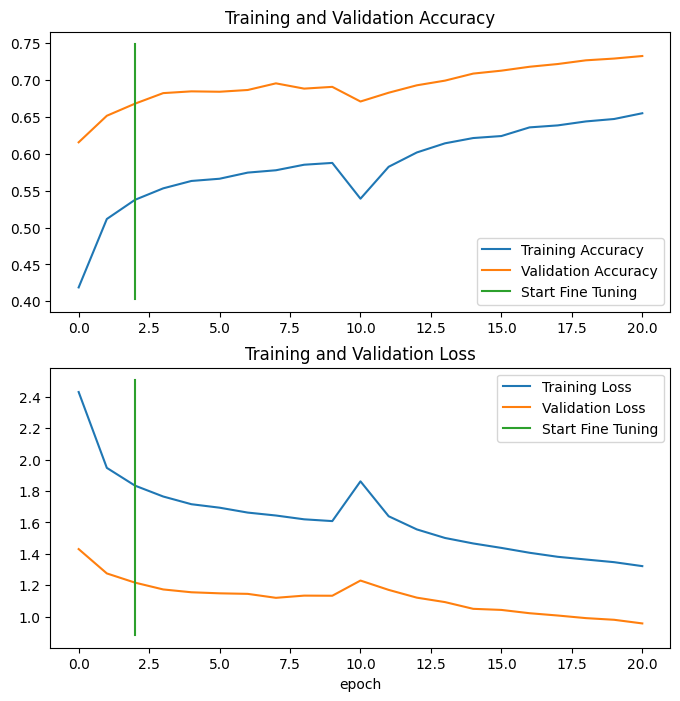

In [ ]:
compare_historys(original_history=history_1,
                 new_history=history_2,
                 initial_epochs=3)

# Saving our trained Model

In [ ]:
# # ## Saving model to Google Drive (optional)

# # # Create save path to drive
save_dir = "drive/MyDrive/Projects/food_vision/"
model_name = "07_efficientnetV2B0_feature_extract_model_mixed_precision.keras"
save_path = os.path.join(save_dir, model_name)

# # Create directory if it doesn't exist
os.makedirs(save_dir, exist_ok=True)

# # # Save model
model_1.save(save_path)

# Let's Predict

Untli now we create model and we got `77% accuracy for model_1 `  
So now we use this to predict the customized images

In [ ]:
# first we have to create the image into our model suitable format (shape = (224,224,3))
from helper_functions import load_and_prep_image,pred_and_plot,make_confusion_matrix

In [ ]:
# # Note: The following confusion matrix code is a remix of Scikit-Learn's
# # plot_confusion_matrix function - https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_confusion_matrix.html
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Our function needs a different name to sklearn's plot_confusion_matrix
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

#   Returns:
#     A labelled confusion matrix plot comparing y_true and y_pred.

#   Example usage:
#     make_confusion_matrix(y_true=test_labels, # ground truth test labels
#                           y_pred=y_preds, # predicted labels
#                           classes=class_names, # array of class label names
#                           figsize=(15, 15),
#                           text_size=10)
#   """
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

#   # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [ ]:
pred_probs = model_1.predict(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step


In [ ]:
len(pred_probs)

25250

In [ ]:
# pred_probs.shape

In [ ]:
# pred_probs[:10]

In [ ]:
# We get one prediction probability per class
print(f"Number of prediction probabilities for sample 0: {len(pred_probs[0])}")
print(f"What prediction probability sample 0 looks like:\n {pred_probs[0]}")
print(f"The class with the highest predicted probability by the model for sample 0: {pred_probs[0].argmax()}")

Number of prediction probabilities for sample 0: 101
What prediction probability sample 0 looks like:
 [4.54692505e-02 1.34609327e-05 3.79111920e-03 2.41341240e-06
 6.18698505e-06 1.70162130e-05 5.02998319e-06 8.17610603e-03
 9.77742597e-02 3.77946475e-04 1.37016876e-04 1.17885465e-04
 4.05142037e-03 3.87986474e-05 6.41749939e-03 1.45285085e-04
 4.31628432e-04 3.16141825e-03 4.68001017e-05 3.56437493e-04
 1.66895814e-04 1.92818952e-05 1.79605221e-03 1.51345348e-05
 1.64381921e-01 2.05254692e-05 1.97391528e-05 5.89102507e-04
 3.11895534e-02 5.34473947e-05 3.23590590e-04 8.32549813e-06
 5.90542506e-04 3.38407808e-05 5.49990963e-03 2.84411908e-05
 4.44828729e-05 1.09436605e-05 1.77633137e-05 5.64517031e-05
 1.15588100e-05 9.10948220e-05 5.42890666e-05 1.44436286e-04
 4.17124771e-04 5.12300491e-01 1.86157959e-05 3.06070375e-04
 2.47101361e-05 4.76229206e-06 1.09562860e-03 4.90460843e-05
 2.99463258e-03 9.73349233e-06 2.78910902e-05 1.15588100e-05
 9.73877788e-04 8.54005921e-04 7.85638243e-

In [ ]:
# # Get the class predicitons of each label
pred_classes = pred_probs.argmax(axis=1)

# How do they look?
pred_classes[:10]
# class_names[48]

array([45, 48, 79, 62, 81, 43, 27, 47,  0, 22])

In [ ]:
# # Note: This might take a minute or so due to unravelling 790 batches
y_labels = []
for images, labels in test_data.unbatch(): # unbatch the test data and get images and labels
  # labels are not one-hot encoded, so we can directly append the label
  y_labels.append(labels.numpy())
# check what they look like (unshuffled)

In [ ]:
y_labels

<function list.count(value, /)>

In [ ]:
# # How many labels are there? (should be the same as how many prediction probabilities we have)
len(y_labels)

2272

In [ ]:
# Plot a confusion matrix with all 25250 predictions, ground truth labels and 101 classes
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(200, 200),
                      text_size=20,
                      norm=True,
                      savefig=True)

In [ ]:
from helper_functions import load_and_prep_image,pred_and_plot

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


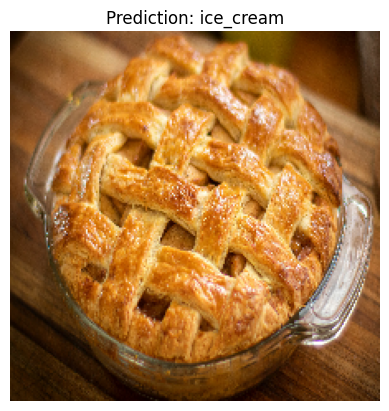

In [ ]:
pred_and_plot(model=model_1,filename="/content/Apple-pie.jpg",class_names=class_names)

In [ ]:
index = class_names.index("prime_rib")
index

79

In [ ]:
# Create a DataFrame to compare the true and predicted class names for the test data
compare_preds_true = pd.DataFrame({
    "true_labels": [class_names[i] for i in y_labels],
    "predicted_labels": [class_names[i] for i in pred_classes]
})

# Display the first few rows of the comparison DataFrame
display(compare_preds_true.head())


,true_labels,predicted_labels
0,fried_rice,frozen_yogurt
1,creme_brulee,greek_salad
2,prime_rib,prime_rib
3,cheesecake,macaroni_and_cheese
4,guacamole,ramen


In [ ]:
# Add a new column showing if prediction is correct
compare_preds_true["match"] = compare_preds_true["true_labels"] == compare_preds_true["predicted_labels"]

# Count correct and incorrect predictions
correct = compare_preds_true["match"].sum()
total = len(compare_preds_true)
accuracy = correct / total

print(f"✅ Correct predictions: {correct}/{total}")
# print(f"🎯 Accuracy: {accuracy:.2%}")


✅ Correct predictions: 240/25250


In [ ]:
correct_df = compare_preds_true[compare_preds_true["match"] == True]
display(correct_df.head())


,true_labels,predicted_labels,match
2,prime_rib,prime_rib,True
28,tacos,tacos,True
37,cannoli,cannoli,True
57,strawberry_shortcake,strawberry_shortcake,True
61,tuna_tartare,tuna_tartare,True


In [ ]:
def pred_and_plot(model, filename, class_names):
  """
  Imports an image located at filename, makes a prediction on it with
  a trained model and plots the image with the predicted class as the title.
  """
  # Import the target image and preprocess it
  img = load_and_prep_image(filename)

  # Make a prediction
  pred = model.predict(tf.expand_dims(img, axis=0))

  # Get the predicted class
  if len(pred[0]) > 1: # check for multi-class
    pred_class = class_names[pred.argmax()] # if more than one output, take the max
  else:
    pred_class = class_names[int(tf.round(pred)[0][0])] # if only one output, round

  # Plot the image and predicted class
  plt.imshow(img)
  plt.title(f"Prediction: {pred_class}")
  plt.axis(False);

In [ ]:
# Test the load_and_prep_image function with a few different images
image1_path = "/content/Apple-pie.jpg"
image2_path = "/content/tacos.jpeg"
image3_path = "/content/prime rib.jpeg"
image4_path = "/content/waffles.jpg"
img1 = load_and_prep_image(image1_path)
img2 = load_and_prep_image(image2_path)
img3 = load_and_prep_image(image3_path)
img4 = load_and_prep_image(image4_path)

print(f"Shape of loaded image 1: {img1.shape}")
print(f"Shape of loaded image 2: {img2.shape}")
print(f"Shape of loaded image 3: {img3.shape}")
print(f"Shape of loaded image 3: {img4.shape}")

# Make predictions on the loaded images and print the predicted class and confidence
images_to_predict = [image1_path, image2_path, image3_path, image4_path]

for image_path in images_to_predict:
  img = load_and_prep_image(image_path)
  pred_probs = model_1.predict(tf.expand_dims(img, axis=0))
  pred_class_index = pred_probs.argmax()
  pred_class_name = class_names[pred_class_index]
  confidence = pred_probs[0][pred_class_index]

  print(f"\nImage: {image_path}")
  print(f"Predicted class: {pred_class_name}")
  print(f"Confidence: {confidence:.2f}")

Shape of loaded image 1: (224, 224, 3)
Shape of loaded image 2: (224, 224, 3)
Shape of loaded image 3: (224, 224, 3)
Shape of loaded image 3: (224, 224, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step

Image: /content/Apple-pie.jpg
Predicted class: ice_cream
Confidence: 0.06
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

Image: /content/tacos.jpeg
Predicted class: ice_cream
Confidence: 0.06
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

Image: /content/prime rib.jpeg
Predicted class: ice_cream
Confidence: 0.06
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

Image: /content/waffles.jpg
Predicted class: ice_cream
Confidence: 0.06
